# Active Object Localization with Deep RL — Double-DQN + Temporal Attention

This notebook starts from the corrected feed-forward **Double-DQN** localizer
and adds the improvements we discussed, plus a **lightweight temporal +
attention** module so we keep what helped in the GRU/attention version without
its ~90M-parameter cost.

**Kept from the Double-DQN base (correctness):**
- Proper Double-DQN target: bootstrap from the *next* state, online-net action
  selection + target-net evaluation, `(1 - done)` mask.
- No reward/done leakage into the network input.
- Grad-CAM keyed to the **fine-tuned 5-class** classifier with the correct class
  index (true class at train time, predicted class at eval time).
- Caicedo 9-action set (translate / scale / change aspect ratio + trigger).

**New in this version:**
1. **Temporal + attention, done cheaply.** A small GRU (hidden 64) runs over the
   last-K *action history* (a 9x9 sequence we already store), and an attention
   layer pools it into one context vector. This gives the model a learned sense
   of *which past actions matter* — the temporal signal — for ~15K extra params
   instead of ~90M. No sequence replay needed: the history vector already lives
   inside each stored state, so the flat Double-DQN replay still works.
2. **ROI-pooled descriptors (big speedup).** Instead of re-cropping pixels and
   running VGG ~20 times per image, we run VGG **once** on the full image and
   ROI-pool the current box out of the cached conv map. Toggle `USE_ROI_CACHE`
   off for the slower, slightly more faithful per-crop path.
3. **Stable training.** Larger replay buffer, slower epsilon decay (exploration
   lasts past the early peak), `ReduceLROnPlateau`, and **early stopping** so we
   don't burn epochs after the model has already peaked.
4. **Learnable trigger.** Running out of steps without triggering is now a
   terminal event with a trigger-style reward, so good stopping is reinforced.
5. **Weak-class oversampling.** `IMAGES_PER_CLASS` is per-class, so the harder
   classes (dog, bicycle) get more samples.

Set the paths in **Config**, then run top to bottom.

In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

import random
import numpy as np
from collections import deque

import cv2
import xml.etree.ElementTree as ET
from PIL import Image
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as T
from torchvision.models import vgg16

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

Device: cuda


## Config
Edit paths/hyper-parameters for your machine. Training time scales roughly with
`EPOCHS * (total images) * MAX_STEPS`. With early stopping you usually only need
a handful of epochs.

In [2]:
# ---- Paths ----
PATH_VOC = "C:/Users/jesli/Downloads/pascal/VOC2012"
CLASSIFIER_WEIGHTS = "vgg16_5class.pth"      # your fine-tuned 5-class VGG
WEIGHTS_DIR = "./improved_localizer_weights"

# ---- Classes ----
SELECTED_CLASSES = ["bicycle", "aeroplane", "horse", "cat", "dog"]
VOC_CLASS_IDS = {"aeroplane": 1, "bicycle": 2, "cat": 8, "dog": 12, "horse": 13}
CLASS_NAME_TO_LABEL = {c: i for i, c in enumerate(SELECTED_CLASSES)}
LABEL_TO_CLASS_NAME = {i: c for c, i in CLASS_NAME_TO_LABEL.items()}
VOCID_TO_LABEL = {VOC_CLASS_IDS[c]: CLASS_NAME_TO_LABEL[c] for c in SELECTED_CLASSES}

# ---- Action space (Caicedo 9-action set) ----
NUM_ACTIONS = 9          # 1-8 transforms, 9 = trigger (terminal)
TRIGGER = 9
ALPHA = 0.2              # box transform step (fraction of current box size)
MIN_BOX = 24             # minimum box side length in pixels

# ---- State ----
DESC_POOL = 4                          # adaptive pool side -> descriptor = 512*POOL*POOL
DESC_DIM = 512 * DESC_POOL * DESC_POOL # 8192
HISTORY_LEN = 9                        # last K actions kept (the temporal sequence)
HIST_DIM = HISTORY_LEN * NUM_ACTIONS   # 81  (9 steps x 9-dim one-hot)
HM_SIZE = 64                           # heatmap crop fed to the small CNN

# ---- Efficiency ----
USE_ROI_CACHE = True     # True: one VGG forward/image + ROI pool (fast).
                         # False: re-crop pixels + re-run VGG each step (slower, more faithful).

# ---- RL / training ----
EPOCHS = 20
PATIENCE = 3                              # early-stop after this many non-improving epochs
IMAGES_PER_CLASS = {                      # weak classes oversampled
    "bicycle": 350, "aeroplane": 300, "horse": 300, "cat": 300, "dog": 350,
}
MAX_STEPS = 20
GAMMA = 0.90
LR = 1e-4
BATCH_SIZE = 64
REPLAY_CAPACITY = 30000                   # was 5000 -> bigger to decorrelate batches
WARMUP = 1000
TARGET_TAU = 0.005
TRAIN_FREQ = 1

IOU_THRESH = 0.5
TRIGGER_REWARD = 3.0
MOVE_REWARD = 1.0

EPS_START = 1.0
EPS_MIN = 0.1
EPS_DECAY_STEPS = 60000   # slower than before so exploration outlasts the early peak

VAL_PER_CLASS = 40        # held-out images/class for validation during training

## VOC helper functions

In [3]:
def load_images_names_in_data_set(data_set_name, path_voc):
    file_path = os.path.join(path_voc, "ImageSets", "Main", data_set_name + ".txt")
    with open(file_path) as f:
        lines = f.readlines()
    names = []
    for line in lines:
        parts = line.split()
        if len(parts) == 1:                 # plain split file
            names.append(parts[0])
        elif "-1" not in parts[1]:          # classification split: keep positives
            names.append(parts[0])
    return names


def get_id_of_class_name(class_name):
    table = {
        "aeroplane": 1, "bicycle": 2, "bird": 3, "boat": 4, "bottle": 5,
        "bus": 6, "car": 7, "cat": 8, "chair": 9, "cow": 10, "diningtable": 11,
        "dog": 12, "horse": 13, "motorbike": 14, "person": 15, "pottedplant": 16,
        "sheep": 17, "sofa": 18, "train": 19, "tvmonitor": 20,
    }
    return table.get(class_name, -1)


def get_bb_of_gt_from_pascal_xml_annotation(xml_name, voc_path):
    """Returns an (N, 5) array: [voc_class_id, xmin, xmax, ymin, ymax]."""
    tree = ET.parse(os.path.join(voc_path, "Annotations", xml_name + ".xml"))
    root = tree.getroot()
    rows = []
    for obj in root.findall("object"):
        name = obj.find("name").text
        bb = obj.find("bndbox")
        rows.append([
            get_id_of_class_name(name),
            float(bb.find("xmin").text),
            float(bb.find("xmax").text),
            float(bb.find("ymin").text),
            float(bb.find("ymax").text),
        ])
    return np.array(rows, dtype=np.float32) if rows else np.zeros((0, 5), np.float32)


def gt_boxes_for_class(annotation, voc_class_id):
    """List of [x0, y0, x1, y1] boxes for the given VOC class id."""
    boxes = []
    for row in annotation:
        if int(row[0]) == voc_class_id:
            boxes.append([int(row[1]), int(row[3]), int(row[2]), int(row[4])])
    return boxes


def calculate_iou_from_boxes(boxA, boxB):
    """Boxes are [x0, y0, x1, y1]."""
    xA = max(boxA[0], boxB[0]); yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2]); yB = min(boxA[3], boxB[3])
    inter = max(0, xB - xA) * max(0, yB - yA)
    areaA = max(0, boxA[2] - boxA[0]) * max(0, boxA[3] - boxA[1])
    areaB = max(0, boxB[2] - boxB[0]) * max(0, boxB[3] - boxB[1])
    union = areaA + areaB - inter
    return inter / union if union > 0 else 0.0


def max_iou(box, gt_boxes):
    best = 0.0
    for gt in gt_boxes:
        best = max(best, calculate_iou_from_boxes(box, gt))
    return best

## Environment: box transforms, region & heatmap crops

The box lives in original-image pixel coordinates as `[x0, y0, x1, y1]` and
starts covering the whole image. Each action shifts or rescales it by a fraction
`ALPHA` of its current size; clamping keeps it valid and inside the image.

In [4]:
def transform_box(box, action, W, H, alpha=ALPHA, min_size=MIN_BOX):
    x0, y0, x1, y1 = box
    aw = alpha * (x1 - x0)
    ah = alpha * (y1 - y0)

    if action == 1:    x0 += aw; x1 += aw                       # move right
    elif action == 2:  x0 -= aw; x1 -= aw                       # move left
    elif action == 3:  y0 -= ah; y1 -= ah                       # move up
    elif action == 4:  y0 += ah; y1 += ah                       # move down
    elif action == 5:  x0 -= aw; x1 += aw; y0 -= ah; y1 += ah   # bigger
    elif action == 6:  x0 += aw; x1 -= aw; y0 += ah; y1 -= ah   # smaller
    elif action == 7:  y0 += ah; y1 -= ah                       # fatter (less height)
    elif action == 8:  x0 += aw; x1 -= aw                       # taller (less width)

    x0 = max(0.0, min(x0, W - min_size))
    y0 = max(0.0, min(y0, H - min_size))
    x1 = min(float(W), max(x0 + min_size, x1))
    y1 = min(float(H), max(y0 + min_size, y1))
    return [int(round(x0)), int(round(y0)), int(round(x1)), int(round(y1))]


def crop_region(image, box, size=224):
    x0, y0, x1, y1 = [int(v) for v in box]
    x0 = max(0, x0); y0 = max(0, y0)
    x1 = min(image.shape[1], x1); y1 = min(image.shape[0], y1)
    crop = image[y0:y1, x0:x1] if (x1 > x0 and y1 > y0) else image
    return cv2.resize(crop, (size, size))


def crop_heatmap(hm_full, box, W, H, size=HM_SIZE):
    """hm_full is a 224x224 saliency map over the whole image."""
    hh, hw = hm_full.shape
    x0, y0, x1, y1 = box
    hx0 = int(x0 / W * hw); hx1 = int(x1 / W * hw)
    hy0 = int(y0 / H * hh); hy1 = int(y1 / H * hh)
    hx0 = max(0, hx0); hy0 = max(0, hy0)
    hx1 = min(hw, max(hx0 + 1, hx1)); hy1 = min(hh, max(hy0 + 1, hy1))
    sub = hm_full[hy0:hy1, hx0:hx1]
    if sub.size == 0:
        sub = hm_full
    return cv2.resize(sub, (size, size)).astype(np.float32)


def update_history(history, action):
    onehot = np.zeros(NUM_ACTIONS, dtype=np.float32)
    onehot[action - 1] = 1.0
    h = history.reshape(HISTORY_LEN, NUM_ACTIONS)
    h = np.roll(h, shift=-1, axis=0)
    h[-1] = onehot
    return h.flatten()

## Grad-CAM (runs on the fine-tuned 5-class classifier)

A forward hook captures activations and a tensor-level gradient hook captures
gradients (attached only when grad is enabled), which avoids the in-place-ReLU
clash that module backward hooks hit on VGG. In-place ReLUs are disabled
defensively, and the grad hook is skipped during `inference_mode` forwards so
descriptor extraction / classification stay cheap.

In [5]:
class GradCAMGenerator:
    def __init__(self, model, target_layer):
        self.model = model
        for m in self.model.modules():           # make hooks/grad safe
            if isinstance(m, nn.ReLU):
                m.inplace = False
        self.activations = None
        self.gradients = None
        target_layer.register_forward_hook(self._forward_hook)

    def _forward_hook(self, module, inp, out):
        self.activations = out.detach()
        if out.requires_grad:                    # only during generate()
            out.register_hook(self._save_grad)

    def _save_grad(self, grad):
        self.gradients = grad.detach()

    def generate(self, img_tensor, class_idx):
        """class_idx is the 5-class index (0..4). Returns a 224x224 [0,1] map."""
        self.activations = None
        self.gradients = None
        self.model.zero_grad(set_to_none=True)
        with torch.enable_grad():
            out = self.model(img_tensor.to(device))
            out[0, class_idx].backward()

        pooled = self.gradients.mean(dim=[0, 2, 3])                 # (C,)
        cam = (self.activations[0] * pooled[:, None, None]).sum(0)  # (h, w)
        cam = torch.relu(cam).cpu().numpy()
        m = cam.max()
        cam = cam / m if m > 0 else cam
        return cv2.resize(cam, (224, 224)).astype(np.float32)

## Backbone, classifier, and the ROI-pooled descriptor

One fine-tuned VGG serves classification, descriptors, and Grad-CAM. With
`USE_ROI_CACHE=True` we run the backbone **once per image** to get the
512x7x7 conv map and ROI-pool the current box out of it — far cheaper than
re-running VGG on every step. The slower per-crop path is one flag away.

In [6]:
vgg_classifier = vgg16(pretrained=False)
vgg_classifier.classifier[6] = nn.Linear(4096, len(SELECTED_CLASSES))
vgg_classifier.load_state_dict(torch.load(CLASSIFIER_WEIGHTS, map_location=device))
vgg_classifier = vgg_classifier.to(device).eval()

backbone = vgg_classifier.features          # outputs 512x7x7
grad_cam = GradCAMGenerator(vgg_classifier, vgg_classifier.features[28])  # last conv

_desc_pool = nn.AdaptiveAvgPool2d((DESC_POOL, DESC_POOL)).to(device)


@torch.inference_mode()
def predict_class(image_rgb):
    t = transform(Image.fromarray(image_rgb)).unsqueeze(0).to(device)
    return int(vgg_classifier(t).argmax(1).item())   # 0..4


@torch.inference_mode()
def extract_descriptor(region_rgb):
    """Slow path: full VGG forward on a cropped region. Returns float16 (DESC_DIM,)."""
    t = transform(Image.fromarray(region_rgb)).unsqueeze(0).to(device)
    f = _desc_pool(backbone(t))
    return f.flatten().cpu().numpy().astype(np.float16)


@torch.inference_mode()
def full_feature_map(image_rgb):
    """Run the backbone once on the whole image -> cached (1,512,7,7) map."""
    t = transform(Image.fromarray(image_rgb)).unsqueeze(0).to(device)
    return backbone(t)


def roi_descriptor(full_feat, box, W, H):
    """ROI-pool the box out of a cached conv map. Returns float16 (DESC_DIM,)."""
    _, _, fh, fw = full_feat.shape
    x0 = max(0, min(fw - 1, int(box[0] / W * fw)))
    y0 = max(0, min(fh - 1, int(box[1] / H * fh)))
    x1 = max(x0 + 1, min(fw, int(round(box[2] / W * fw))))
    y1 = max(y0 + 1, min(fh, int(round(box[3] / H * fh))))
    roi = full_feat[:, :, y0:y1, x0:x1]
    return _desc_pool(roi).flatten().cpu().numpy().astype(np.float16)


def make_descriptor_fn(image):
    """Returns box -> descriptor, caching the conv map once if ROI mode is on."""
    W, H = image.shape[1], image.shape[0]
    if USE_ROI_CACHE:
        feat = full_feature_map(image)
        return lambda box: roi_descriptor(feat, box, W, H)
    return lambda box: extract_descriptor(crop_region(image, box))

c:\Users\jesli\.conda\envs\vgg16_env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jesli\.conda\envs\vgg16_env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\jesli\AppData\Local\Temp\ipykernel_29360\3263294040.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weig

## Compact Double-DQN with temporal attention over the action history

The action history is a length-9 sequence of 9-dim one-hots — a genuine temporal
signal of what the agent has done. A small GRU encodes it and an attention layer
pools it, so the network learns *which past actions matter* for the next move.
This is the cheap, honest version of the GRU+attention idea: ~15K params instead
of ~90M, and no sequence replay (the history already lives in each state).

In [7]:
class HistoryAttention(nn.Module):
    """Attention pooling over the GRU outputs of the action-history sequence."""
    def __init__(self, hidden):
        super().__init__()
        self.score = nn.Linear(hidden, 1)

    def forward(self, seq):                       # seq: (B, T, H)
        w = torch.softmax(self.score(seq), dim=1) # (B, T, 1)
        return (seq * w).sum(dim=1)               # (B, H)


class DQN(nn.Module):
    def __init__(self, desc_dim=DESC_DIM, hm_feat=128,
                 hist_hidden=64, num_actions=NUM_ACTIONS):
        super().__init__()
        self.desc_fc = nn.Linear(desc_dim, 512)

        self.hm_cnn = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.AdaptiveAvgPool2d((4, 4)),
        )
        self.hm_fc = nn.Linear(32 * 4 * 4, hm_feat)

        # Temporal: GRU + attention over the last-K action one-hots
        self.hist_gru = nn.GRU(NUM_ACTIONS, hist_hidden, batch_first=True)
        self.hist_attn = HistoryAttention(hist_hidden)

        self.fc1 = nn.Linear(512 + hm_feat + hist_hidden, 512)
        self.drop = nn.Dropout(0.2)
        self.out = nn.Linear(512, num_actions)

    def forward(self, desc, hist, hm):
        d = F.relu(self.desc_fc(desc))

        h = self.hm_cnn(hm).flatten(1)
        h = F.relu(self.hm_fc(h))

        seq = hist.view(hist.size(0), HISTORY_LEN, NUM_ACTIONS)  # (B, T, A)
        g, _ = self.hist_gru(seq)                                # (B, T, hidden)
        t = self.hist_attn(g)                                    # (B, hidden)

        x = torch.cat([d, h, t], dim=1)
        x = self.drop(F.relu(self.fc1(x)))
        return self.out(x)


def soft_update(target, source, tau):
    for tp, sp in zip(target.parameters(), source.parameters()):
        tp.data.copy_(tau * sp.data + (1.0 - tau) * tp.data)

## Replay buffer (capped, float16 storage)

In [8]:
class ReplayBuffer:
    def __init__(self, capacity=REPLAY_CAPACITY):
        self.buf = deque(maxlen=capacity)

    def push(self, desc, hist, hm, action_idx, reward, ndesc, nhist, nhm, done):
        self.buf.append((
            desc, hist.astype(np.float16), hm.astype(np.float16), action_idx, reward,
            ndesc, nhist.astype(np.float16), nhm.astype(np.float16), float(done),
        ))

    def __len__(self):
        return len(self.buf)

    def sample(self, batch_size):
        batch = random.sample(self.buf, batch_size)
        to = lambda arr, dt=torch.float32: torch.as_tensor(np.stack(arr)).to(device, dt)
        desc  = to([b[0] for b in batch])
        hist  = to([b[1] for b in batch])
        hm    = to([b[2] for b in batch]).unsqueeze(1)
        act   = torch.as_tensor([b[3] for b in batch], device=device, dtype=torch.long)
        rew   = torch.as_tensor([b[4] for b in batch], device=device, dtype=torch.float32)
        ndesc = to([b[5] for b in batch])
        nhist = to([b[6] for b in batch])
        nhm   = to([b[7] for b in batch]).unsqueeze(1)
        done  = torch.as_tensor([b[8] for b in batch], device=device, dtype=torch.float32)
        return desc, hist, hm, act, rew, ndesc, nhist, nhm, done

## Action selection and the Double-DQN optimisation step

In [9]:
def select_action(net, desc_np, hist_np, hm_np, epsilon):
    if random.random() < epsilon:
        return random.randint(1, NUM_ACTIONS)
    desc_t = torch.as_tensor(desc_np.astype(np.float32)).unsqueeze(0).to(device)
    hist_t = torch.as_tensor(hist_np.astype(np.float32)).unsqueeze(0).to(device)
    hm_t = torch.as_tensor(hm_np.astype(np.float32)).unsqueeze(0).unsqueeze(0).to(device)
    with torch.inference_mode():
        q = net(desc_t, hist_t, hm_t)
    return int(q.argmax(1).item()) + 1


def optimize(online, target, optimizer, replay):
    if len(replay) < max(WARMUP, BATCH_SIZE):
        return None
    desc, hist, hm, act, rew, ndesc, nhist, nhm, done = replay.sample(BATCH_SIZE)

    with torch.no_grad():
        next_online = online(ndesc, nhist, nhm)          # action selection
        next_act = next_online.argmax(1, keepdim=True)
        next_target = target(ndesc, nhist, nhm)          # action evaluation
        next_q = next_target.gather(1, next_act).squeeze(1)
        y = rew + GAMMA * next_q * (1.0 - done)

    q = online(desc, hist, hm).gather(1, act.view(-1, 1)).squeeze(1)
    loss = F.smooth_l1_loss(q, y)

    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    nn.utils.clip_grad_norm_(online.parameters(), 5.0)
    optimizer.step()
    soft_update(target, online, TARGET_TAU)
    return loss.item()

## Validation (uses the *predicted* class — realistic pipeline)
Reports per-class mean IoU and classifier accuracy so the two are not conflated.

In [10]:
def build_validation_set(path_voc, per_class=VAL_PER_CLASS):
    names, labels = [], []
    for c in SELECTED_CLASSES:
        pool = load_images_names_in_data_set(f"{c}_val", path_voc)
        sampled = random.sample(pool, min(per_class, len(pool)))
        names += sampled
        labels += [CLASS_NAME_TO_LABEL[c]] * len(sampled)
    return names, labels


@torch.inference_mode()
def run_episode_greedy(net, image, heatmap, init_box):
    W, H = image.shape[1], image.shape[0]
    desc_fn = make_descriptor_fn(image)
    box = list(init_box)
    history = np.zeros(HIST_DIM, dtype=np.float32)
    desc = desc_fn(box)
    hm = crop_heatmap(heatmap, box, W, H)
    boxes = [box.copy()]
    for _ in range(MAX_STEPS):
        action = select_action(net, desc, history, hm, epsilon=0.0)
        if action == TRIGGER:
            break
        box = transform_box(box, action, W, H)
        history = update_history(history, action)
        desc = desc_fn(box)
        hm = crop_heatmap(heatmap, box, W, H)
        boxes.append(box.copy())
    return box, boxes


def evaluate(net, names, labels, path_voc, verbose=True):
    net.eval()
    iou_by_class = {c: [] for c in SELECTED_CLASSES}
    correct = 0
    for name, true_label in zip(names, labels):
        image = np.array(Image.open(
            os.path.join(path_voc, "JPEGImages", f"{name}.jpg")).convert("RGB"))
        pred_label = predict_class(image)
        correct += int(pred_label == true_label)

        t = transform(Image.fromarray(image)).unsqueeze(0).to(device)
        heatmap = grad_cam.generate(t, class_idx=pred_label)
        init_box = [0, 0, image.shape[1], image.shape[0]]
        final_box, _ = run_episode_greedy(net, image, heatmap, init_box)

        voc_id = VOC_CLASS_IDS[LABEL_TO_CLASS_NAME[pred_label]]
        ann = get_bb_of_gt_from_pascal_xml_annotation(name, path_voc)
        gts = gt_boxes_for_class(ann, voc_id)
        iou_by_class[LABEL_TO_CLASS_NAME[true_label]].append(max_iou(final_box, gts))

    result = {c: (np.mean(v) if v else 0.0) for c, v in iou_by_class.items()}
    if verbose:
        for c in SELECTED_CLASSES:
            print(f"  {c.title():10s} IoU: {result[c]:.4f}  (n={len(iou_by_class[c])})")
        print(f"  Classifier accuracy: {correct / max(1, len(names)):.4f}")
        print(f"  mIoU: {np.mean(list(result.values())):.4f}")
    return result

## Training loop
Grad-CAM and reward both use the **true** class so the learning signal is clean.
Includes the learnable trigger (running out of steps becomes a terminal event),
`ReduceLROnPlateau`, and early stopping on validation mIoU.

In [11]:
def train_localizer(path_voc=PATH_VOC, weights_dir=WEIGHTS_DIR, epochs=EPOCHS):
    os.makedirs(weights_dir, exist_ok=True)

    online = DQN().to(device)
    target = DQN().to(device)
    target.load_state_dict(online.state_dict())
    target.eval()
    optimizer = optim.Adam(online.parameters(), lr=LR)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=0.5, patience=1)
    replay = ReplayBuffer()

    val_names, val_labels = build_validation_set(path_voc)
    n_params = sum(p.numel() for p in online.parameters())
    print(f"DQN parameters: {n_params/1e6:.2f}M")

    global_step = 0
    best_miou = -1.0
    no_improve = 0

    for epoch in range(epochs):
        print(f"\nEpoch {epoch + 1}/{epochs}")
        online.train()

        combined = []
        for c in SELECTED_CLASSES:
            pool = load_images_names_in_data_set(f"{c}_trainval", path_voc)
            k = IMAGES_PER_CLASS[c] if isinstance(IMAGES_PER_CLASS, dict) else IMAGES_PER_CLASS
            sampled = random.sample(pool, min(k, len(pool)))
            combined += [(name, VOC_CLASS_IDS[c]) for name in sampled]
        random.shuffle(combined)

        epoch_losses = []
        for name, voc_id in tqdm(combined, desc=f"Epoch {epoch + 1}"):
            image = np.array(Image.open(
                os.path.join(path_voc, "JPEGImages", f"{name}.jpg")).convert("RGB"))
            W, H = image.shape[1], image.shape[0]
            true_label = VOCID_TO_LABEL[voc_id]

            t = transform(Image.fromarray(image)).unsqueeze(0).to(device)
            heatmap = grad_cam.generate(t, class_idx=true_label)
            ann = get_bb_of_gt_from_pascal_xml_annotation(name, path_voc)
            gts = gt_boxes_for_class(ann, voc_id)
            if not gts:
                continue

            desc_fn = make_descriptor_fn(image)        # caches conv map once
            box = [0, 0, W, H]
            history = np.zeros(HIST_DIM, dtype=np.float32)
            desc = desc_fn(box)
            hm = crop_heatmap(heatmap, box, W, H)
            prev_iou = max_iou(box, gts)

            epsilon = max(EPS_MIN,
                          EPS_START - (EPS_START - EPS_MIN) * global_step / EPS_DECAY_STEPS)

            for step in range(MAX_STEPS):
                action = select_action(online, desc, history, hm, epsilon)
                # Learnable trigger: running out of steps is a terminal event too.
                forced = (step == MAX_STEPS - 1) and (action != TRIGGER)
                done = (action == TRIGGER) or forced

                if action == TRIGGER:
                    new_box = box
                    ndesc, nhm = desc, hm
                    nhist = update_history(history, action)
                    new_iou = prev_iou
                    reward = TRIGGER_REWARD if new_iou >= IOU_THRESH else -TRIGGER_REWARD
                else:
                    new_box = transform_box(box, action, W, H)
                    nhist = update_history(history, action)
                    ndesc = desc_fn(new_box)
                    nhm = crop_heatmap(heatmap, new_box, W, H)
                    new_iou = max_iou(new_box, gts)
                    if forced:   # ran out of budget -> judged like a trigger
                        reward = TRIGGER_REWARD if new_iou >= IOU_THRESH else -TRIGGER_REWARD
                    else:
                        reward = MOVE_REWARD if new_iou > prev_iou else -MOVE_REWARD

                replay.push(desc, history, hm, action - 1, reward,
                            ndesc, nhist, nhm, done)

                global_step += 1
                if global_step % TRAIN_FREQ == 0:
                    loss = optimize(online, target, optimizer, replay)
                    if loss is not None:
                        epoch_losses.append(loss)

                box, history, desc, hm, prev_iou = new_box, nhist, ndesc, nhm, new_iou
                if done:
                    break

        torch.save(online.state_dict(), f"{weights_dir}/model_epoch_{epoch + 1}.pth")

        print(f"Validation after epoch {epoch + 1}:")
        result = evaluate(online, val_names, val_labels, path_voc)
        miou = np.mean(list(result.values()))
        scheduler.step(miou)

        if miou > best_miou:
            best_miou = miou
            no_improve = 0
            torch.save(online.state_dict(), f"{weights_dir}/model_best.pth")
            print(f"  ** new best mIoU {best_miou:.4f} -> saved model_best.pth")
        else:
            no_improve += 1
            print(f"  no improvement ({no_improve}/{PATIENCE}); best mIoU {best_miou:.4f}")

        if epoch_losses:
            lr_now = optimizer.param_groups[0]["lr"]
            print(f"  avg loss: {np.mean(epoch_losses):.4f}   eps: {epsilon:.3f}   lr: {lr_now:.2e}")

        if no_improve >= PATIENCE:
            print(f"Early stopping at epoch {epoch + 1} (best mIoU {best_miou:.4f}).")
            break

    return online

In [12]:
online = train_localizer()

DQN parameters: 4.65M

Epoch 1/20


Epoch 1: 100%|██████████| 1600/1600 [03:52<00:00,  6.89it/s]


Validation after epoch 1:
  Bicycle    IoU: 0.3498  (n=40)
  Aeroplane  IoU: 0.4048  (n=40)
  Horse      IoU: 0.4218  (n=40)
  Cat        IoU: 0.5752  (n=40)
  Dog        IoU: 0.3827  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.4269
  ** new best mIoU 0.4269 -> saved model_best.pth
  avg loss: 0.2000   eps: 0.790   lr: 1.00e-04

Epoch 2/20


Epoch 2: 100%|██████████| 1600/1600 [04:50<00:00,  5.50it/s]


Validation after epoch 2:
  Bicycle    IoU: 0.3697  (n=40)
  Aeroplane  IoU: 0.3997  (n=40)
  Horse      IoU: 0.3791  (n=40)
  Cat        IoU: 0.5473  (n=40)
  Dog        IoU: 0.3488  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.4089
  no improvement (1/3); best mIoU 0.4269
  avg loss: 1.0942   eps: 0.542   lr: 1.00e-04

Epoch 3/20


Epoch 3: 100%|██████████| 1600/1600 [05:42<00:00,  4.67it/s]


Validation after epoch 3:
  Bicycle    IoU: 0.4415  (n=40)
  Aeroplane  IoU: 0.3539  (n=40)
  Horse      IoU: 0.4300  (n=40)
  Cat        IoU: 0.6086  (n=40)
  Dog        IoU: 0.3938  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.4456
  ** new best mIoU 0.4456 -> saved model_best.pth
  avg loss: 1.6878   eps: 0.245   lr: 1.00e-04

Epoch 4/20


Epoch 4: 100%|██████████| 1600/1600 [06:50<00:00,  3.90it/s]


Validation after epoch 4:
  Bicycle    IoU: 0.4642  (n=40)
  Aeroplane  IoU: 0.4130  (n=40)
  Horse      IoU: 0.4276  (n=40)
  Cat        IoU: 0.5924  (n=40)
  Dog        IoU: 0.4518  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.4698
  ** new best mIoU 0.4698 -> saved model_best.pth
  avg loss: 0.6354   eps: 0.100   lr: 1.00e-04

Epoch 5/20


Epoch 5: 100%|██████████| 1600/1600 [06:31<00:00,  4.08it/s]


Validation after epoch 5:
  Bicycle    IoU: 0.4451  (n=40)
  Aeroplane  IoU: 0.4444  (n=40)
  Horse      IoU: 0.4621  (n=40)
  Cat        IoU: 0.6215  (n=40)
  Dog        IoU: 0.4112  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.4769
  ** new best mIoU 0.4769 -> saved model_best.pth
  avg loss: 0.3681   eps: 0.100   lr: 1.00e-04

Epoch 6/20


Epoch 6: 100%|██████████| 1600/1600 [06:00<00:00,  4.44it/s]


Validation after epoch 6:
  Bicycle    IoU: 0.4738  (n=40)
  Aeroplane  IoU: 0.4710  (n=40)
  Horse      IoU: 0.4457  (n=40)
  Cat        IoU: 0.6393  (n=40)
  Dog        IoU: 0.4718  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5003
  ** new best mIoU 0.5003 -> saved model_best.pth
  avg loss: 0.2947   eps: 0.100   lr: 1.00e-04

Epoch 7/20


Epoch 7: 100%|██████████| 1600/1600 [05:47<00:00,  4.60it/s]


Validation after epoch 7:
  Bicycle    IoU: 0.4723  (n=40)
  Aeroplane  IoU: 0.4581  (n=40)
  Horse      IoU: 0.4717  (n=40)
  Cat        IoU: 0.6326  (n=40)
  Dog        IoU: 0.4724  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5014
  ** new best mIoU 0.5014 -> saved model_best.pth
  avg loss: 0.2696   eps: 0.100   lr: 1.00e-04

Epoch 8/20


Epoch 8: 100%|██████████| 1600/1600 [05:41<00:00,  4.68it/s]


Validation after epoch 8:
  Bicycle    IoU: 0.4812  (n=40)
  Aeroplane  IoU: 0.4484  (n=40)
  Horse      IoU: 0.4441  (n=40)
  Cat        IoU: 0.6742  (n=40)
  Dog        IoU: 0.4682  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5032
  ** new best mIoU 0.5032 -> saved model_best.pth
  avg loss: 0.2422   eps: 0.100   lr: 1.00e-04

Epoch 9/20


Epoch 9: 100%|██████████| 1600/1600 [05:25<00:00,  4.91it/s]


Validation after epoch 9:
  Bicycle    IoU: 0.4451  (n=40)
  Aeroplane  IoU: 0.4647  (n=40)
  Horse      IoU: 0.4549  (n=40)
  Cat        IoU: 0.6668  (n=40)
  Dog        IoU: 0.4912  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5045
  ** new best mIoU 0.5045 -> saved model_best.pth
  avg loss: 0.2144   eps: 0.100   lr: 1.00e-04

Epoch 10/20


Epoch 10: 100%|██████████| 1600/1600 [05:30<00:00,  4.84it/s]


Validation after epoch 10:
  Bicycle    IoU: 0.4929  (n=40)
  Aeroplane  IoU: 0.4861  (n=40)
  Horse      IoU: 0.4896  (n=40)
  Cat        IoU: 0.6784  (n=40)
  Dog        IoU: 0.4830  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5260
  ** new best mIoU 0.5260 -> saved model_best.pth
  avg loss: 0.2100   eps: 0.100   lr: 1.00e-04

Epoch 11/20


Epoch 11: 100%|██████████| 1600/1600 [05:30<00:00,  4.84it/s]


Validation after epoch 11:
  Bicycle    IoU: 0.4677  (n=40)
  Aeroplane  IoU: 0.4876  (n=40)
  Horse      IoU: 0.4790  (n=40)
  Cat        IoU: 0.6655  (n=40)
  Dog        IoU: 0.5087  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5217
  no improvement (1/3); best mIoU 0.5260
  avg loss: 0.1945   eps: 0.100   lr: 1.00e-04

Epoch 12/20


Epoch 12: 100%|██████████| 1600/1600 [05:14<00:00,  5.08it/s]


Validation after epoch 12:
  Bicycle    IoU: 0.4862  (n=40)
  Aeroplane  IoU: 0.4721  (n=40)
  Horse      IoU: 0.5069  (n=40)
  Cat        IoU: 0.6969  (n=40)
  Dog        IoU: 0.4831  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5291
  ** new best mIoU 0.5291 -> saved model_best.pth
  avg loss: 0.1899   eps: 0.100   lr: 1.00e-04

Epoch 13/20


Epoch 13: 100%|██████████| 1600/1600 [05:11<00:00,  5.14it/s]


Validation after epoch 13:
  Bicycle    IoU: 0.4720  (n=40)
  Aeroplane  IoU: 0.5118  (n=40)
  Horse      IoU: 0.5201  (n=40)
  Cat        IoU: 0.6591  (n=40)
  Dog        IoU: 0.4681  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5262
  no improvement (1/3); best mIoU 0.5291
  avg loss: 0.1873   eps: 0.100   lr: 1.00e-04

Epoch 14/20


Epoch 14: 100%|██████████| 1600/1600 [05:01<00:00,  5.31it/s]


Validation after epoch 14:
  Bicycle    IoU: 0.4849  (n=40)
  Aeroplane  IoU: 0.4865  (n=40)
  Horse      IoU: 0.4644  (n=40)
  Cat        IoU: 0.6709  (n=40)
  Dog        IoU: 0.5091  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5232
  no improvement (2/3); best mIoU 0.5291
  avg loss: 0.1854   eps: 0.100   lr: 5.00e-05

Epoch 15/20


Epoch 15: 100%|██████████| 1600/1600 [04:49<00:00,  5.53it/s]


Validation after epoch 15:
  Bicycle    IoU: 0.4946  (n=40)
  Aeroplane  IoU: 0.4870  (n=40)
  Horse      IoU: 0.5027  (n=40)
  Cat        IoU: 0.6823  (n=40)
  Dog        IoU: 0.5143  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5362
  ** new best mIoU 0.5362 -> saved model_best.pth
  avg loss: 0.1906   eps: 0.100   lr: 5.00e-05

Epoch 16/20


Epoch 16: 100%|██████████| 1600/1600 [04:50<00:00,  5.50it/s]


Validation after epoch 16:
  Bicycle    IoU: 0.5128  (n=40)
  Aeroplane  IoU: 0.4907  (n=40)
  Horse      IoU: 0.5170  (n=40)
  Cat        IoU: 0.6908  (n=40)
  Dog        IoU: 0.4878  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5398
  ** new best mIoU 0.5398 -> saved model_best.pth
  avg loss: 0.2026   eps: 0.100   lr: 5.00e-05

Epoch 17/20


Epoch 17: 100%|██████████| 1600/1600 [05:44<00:00,  4.65it/s]


Validation after epoch 17:
  Bicycle    IoU: 0.5321  (n=40)
  Aeroplane  IoU: 0.5014  (n=40)
  Horse      IoU: 0.4986  (n=40)
  Cat        IoU: 0.6807  (n=40)
  Dog        IoU: 0.4711  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5368
  no improvement (1/3); best mIoU 0.5398
  avg loss: 0.2031   eps: 0.100   lr: 5.00e-05

Epoch 18/20


Epoch 18: 100%|██████████| 1600/1600 [12:40<00:00,  2.10it/s]


Validation after epoch 18:
  Bicycle    IoU: 0.4792  (n=40)
  Aeroplane  IoU: 0.4861  (n=40)
  Horse      IoU: 0.5257  (n=40)
  Cat        IoU: 0.6959  (n=40)
  Dog        IoU: 0.4877  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5349
  no improvement (2/3); best mIoU 0.5398
  avg loss: 0.2024   eps: 0.100   lr: 2.50e-05

Epoch 19/20


Epoch 19: 100%|██████████| 1600/1600 [12:37<00:00,  2.11it/s]  


Validation after epoch 19:
  Bicycle    IoU: 0.4846  (n=40)
  Aeroplane  IoU: 0.5270  (n=40)
  Horse      IoU: 0.5107  (n=40)
  Cat        IoU: 0.6963  (n=40)
  Dog        IoU: 0.4912  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5420
  ** new best mIoU 0.5420 -> saved model_best.pth
  avg loss: 0.2203   eps: 0.100   lr: 2.50e-05

Epoch 20/20


Epoch 20: 100%|██████████| 1600/1600 [05:02<00:00,  5.30it/s]


Validation after epoch 20:
  Bicycle    IoU: 0.4847  (n=40)
  Aeroplane  IoU: 0.4897  (n=40)
  Horse      IoU: 0.5280  (n=40)
  Cat        IoU: 0.6787  (n=40)
  Dog        IoU: 0.5246  (n=40)
  Classifier accuracy: 0.9950
  mIoU: 0.5411
  no improvement (1/3); best mIoU 0.5420
  avg loss: 0.2311   eps: 0.100   lr: 2.50e-05


## Visualise detections
Blue = the agent's intermediate boxes, green = ground truth, red = final box.

C:\Users\jesli\AppData\Local\Temp\ipykernel_29360\2600199648.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best.load_state_dict(torch.load(f"{WEIGHTS_DIR}/model_best.

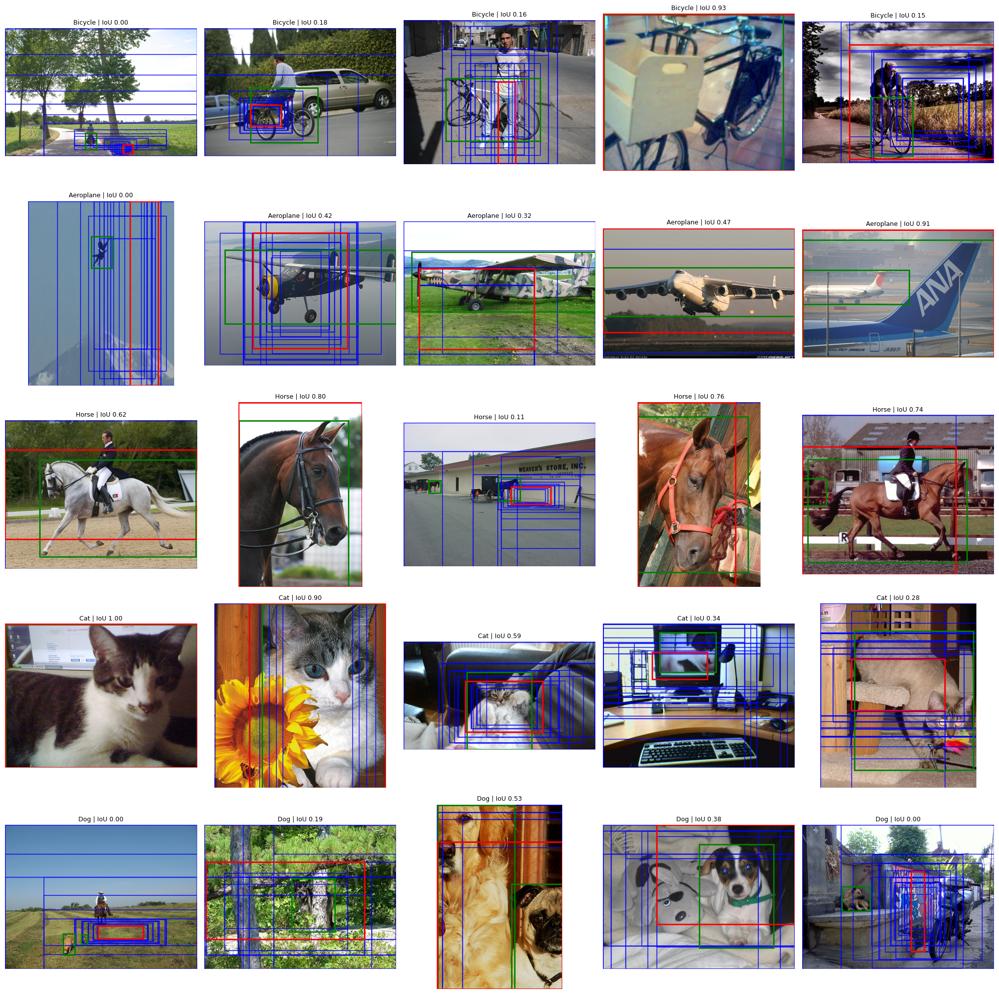

In [13]:
def visualize_detections(net, path_voc=PATH_VOC, num_per_class=5):
    net.eval()
    rows = len(SELECTED_CLASSES)
    fig, axs = plt.subplots(rows, num_per_class,
                            figsize=(num_per_class * 4, rows * 4))
    if rows == 1:
        axs = axs[np.newaxis, :]

    for r, c in enumerate(SELECTED_CLASSES):
        pool = load_images_names_in_data_set(f"{c}_val", path_voc)
        sampled = random.sample(pool, min(num_per_class, len(pool)))
        for col, name in enumerate(sampled):
            image = np.array(Image.open(
                os.path.join(path_voc, "JPEGImages", f"{name}.jpg")).convert("RGB"))
            pred_label = predict_class(image)
            t = transform(Image.fromarray(image)).unsqueeze(0).to(device)
            heatmap = grad_cam.generate(t, class_idx=pred_label)
            init_box = [0, 0, image.shape[1], image.shape[0]]
            final_box, step_boxes = run_episode_greedy(net, image, heatmap, init_box)

            voc_id = VOC_CLASS_IDS[LABEL_TO_CLASS_NAME[pred_label]]
            ann = get_bb_of_gt_from_pascal_xml_annotation(name, path_voc)
            gts = gt_boxes_for_class(ann, voc_id)
            iou = max_iou(final_box, gts)

            ax = axs[r, col]
            ax.imshow(image)
            for b in step_boxes:
                ax.add_patch(patches.Rectangle((b[0], b[1]), b[2] - b[0], b[3] - b[1],
                             linewidth=1, edgecolor="blue", facecolor="none"))
            for g in gts:
                ax.add_patch(patches.Rectangle((g[0], g[1]), g[2] - g[0], g[3] - g[1],
                             linewidth=2, edgecolor="green", facecolor="none"))
            ax.add_patch(patches.Rectangle((final_box[0], final_box[1]),
                         final_box[2] - final_box[0], final_box[3] - final_box[1],
                         linewidth=2, edgecolor="red", facecolor="none"))
            ax.set_title(f"{LABEL_TO_CLASS_NAME[pred_label].title()} | IoU {iou:.2f}",
                         fontsize=9)
            ax.axis("off")

    plt.tight_layout()
    plt.show()


best = DQN().to(device)
best.load_state_dict(torch.load(f"{WEIGHTS_DIR}/model_best.pth", map_location=device))
best.eval()
visualize_detections(best, num_per_class=5)

## Grad-CAM overlay sanity check
Confirms the heatmap is keyed to the right class (it should light up on the
object, not on random regions).

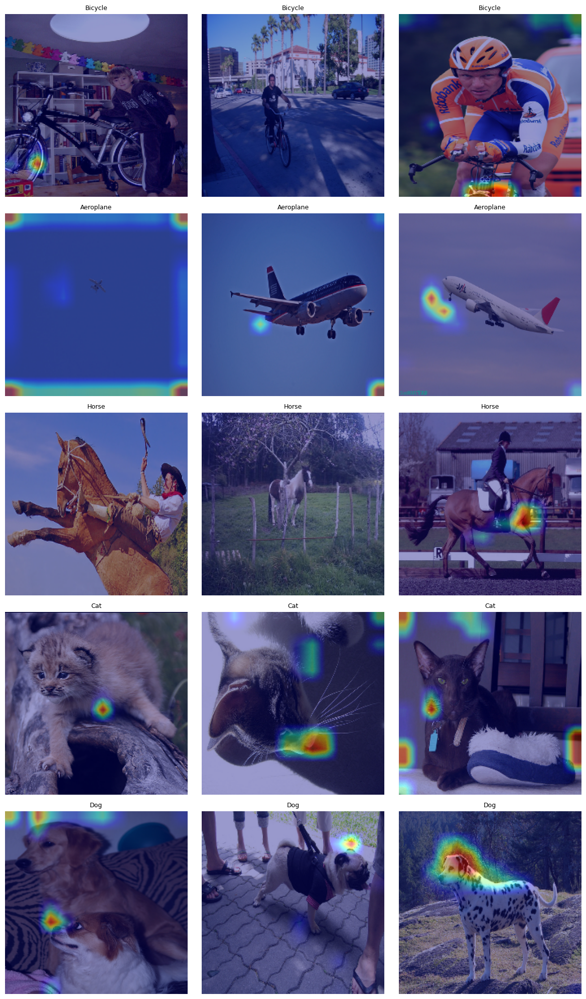

In [14]:
def show_gradcam_overlays(path_voc=PATH_VOC, num_per_class=3):
    rows = len(SELECTED_CLASSES)
    fig, axs = plt.subplots(rows, num_per_class,
                            figsize=(num_per_class * 4, rows * 4))
    if rows == 1:
        axs = axs[np.newaxis, :]
    for r, c in enumerate(SELECTED_CLASSES):
        pool = load_images_names_in_data_set(f"{c}_val", path_voc)
        sampled = random.sample(pool, min(num_per_class, len(pool)))
        for col, name in enumerate(sampled):
            image = np.array(Image.open(
                os.path.join(path_voc, "JPEGImages", f"{name}.jpg")).convert("RGB"))
            pred_label = predict_class(image)
            t = transform(Image.fromarray(image)).unsqueeze(0).to(device)
            heatmap = grad_cam.generate(t, class_idx=pred_label)

            hm_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
            hm_color = cv2.cvtColor(hm_color, cv2.COLOR_BGR2RGB)
            base = cv2.resize(image, (224, 224))
            overlay = cv2.addWeighted(base, 0.6, hm_color, 0.4, 0)

            ax = axs[r, col]
            ax.imshow(overlay)
            ax.set_title(f"{LABEL_TO_CLASS_NAME[pred_label].title()}", fontsize=9)
            ax.axis("off")
    plt.tight_layout()
    plt.show()


show_gradcam_overlays(num_per_class=3)

## Final evaluation on a larger held-out set

In [15]:
test_names, test_labels = build_validation_set(PATH_VOC, per_class=200)
print("Final evaluation (200 images/class):")
final_result = evaluate(best, test_names, test_labels, PATH_VOC)

Final evaluation (200 images/class):
  Bicycle    IoU: 0.4931  (n=200)
  Aeroplane  IoU: 0.5369  (n=200)
  Horse      IoU: 0.5601  (n=200)
  Cat        IoU: 0.6031  (n=200)
  Dog        IoU: 0.4943  (n=200)
  Classifier accuracy: 0.9920
  mIoU: 0.5375
